<a href="https://colab.research.google.com/github/alzaidawi/PORTAL_code/blob/main/Predict_pores_shapes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

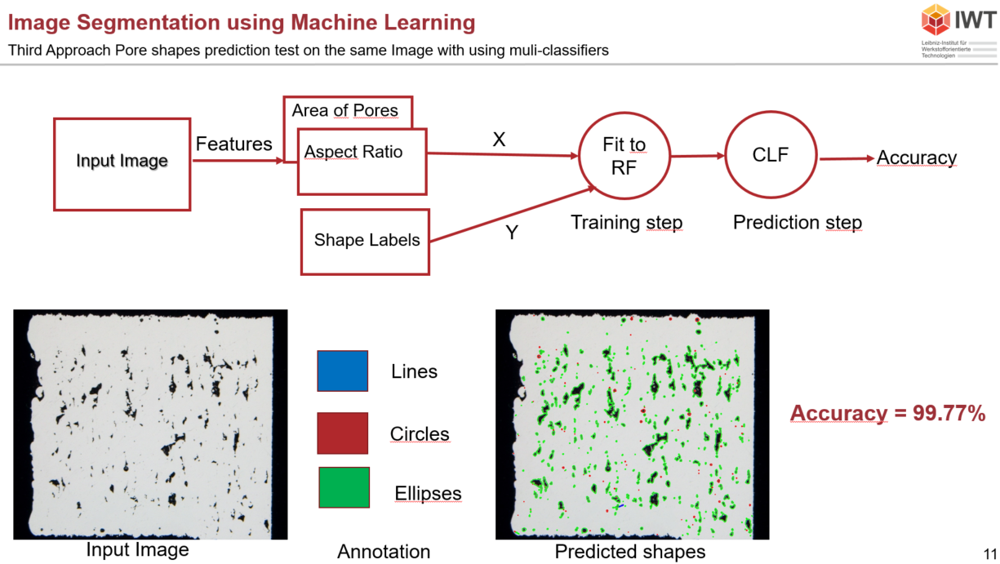

len main contours 449
len cnt 449
y (440,)
label_pred [2]
pred_res (440, 1)
Accuracy =  0.9977272727272727


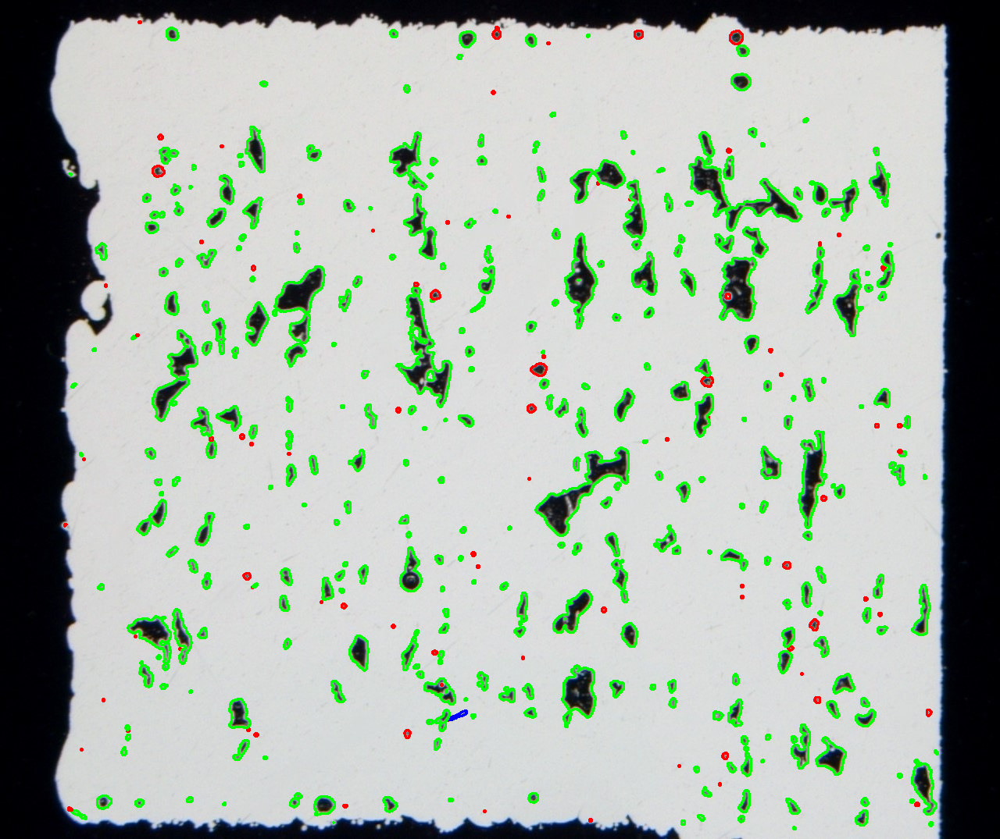

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from sklearn import metrics

################################### draw the countours
# img = cv2.imread('/content/001_cropped.JPG')
# print(img.shape)
# gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# ret, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
# contours, _ = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
# cv2.drawContours(img, contours, -1, (0,0,255), 2)  # plot the contour
# cv2.imwrite("drawContours.jpg", img)
# cv2_imshow(img)
##################################

img = cv2.imread('/content/001_cropped.JPG')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#img = cv2.imread('/content/Picture11.jpg', cv2.COLOR_BGR2GRAY)

# cv2_imshow(img)
# print(img.shape)
# Threshold the image to obtain binary image
ret, binary = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)

# Find contours in the binary image
#contours, hierarchy = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours, hierarchy = cv2.findContours(binary, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
############################ my code
# Define the feature vector containing aspect ratio and area
# X = np.zeros((len(contours), 2))
# y = np.zeros(len(contours), dtype=np.int32)
X1 = []
X2 = []
y_list = []
print('len main contours', len(contours))
max_cnt = max(contours, key = cv2.contourArea)


#cv.drawContours(	image, contours, contourIdx, color[, thickness[, lineType[, hierarchy[, maxLevel[, offset]]]]]	) -> 	image

for i, cnt in enumerate(contours):
  rect = cv2.minAreaRect(cnt) #%
  area = cv2.contourArea(cnt)
  max_area=cv2.contourArea(max_cnt)
#for cnt in contours:
  if area != max_area and area != 0: # if the current contour area is not equal to workpiece area 
    (cx, cy), (w, h), angle = rect # No conversion reqird in the aspect ratio the unit divided
    aspect_ratio = max(w, h) / min(w, h) 
    # Store the feature vector and label for this contour
    # X[i, 0] = aspect_ratio
    # X[i, 1] = area
    X1.append(aspect_ratio)
    X2.append(area)    
    # Get the shape of the contour
    if aspect_ratio >= 5:
        #y[i] = 1  # Label as an line
        y_list.append(1)  # Label as an line
    elif aspect_ratio > 1 and aspect_ratio < 5:
        y_list.append(3)  # Label as an ellipse 
    else:
        y_list.append(2)  # Label as a circle

X = np.zeros((len(X1), 2))
y = np.zeros(len(y_list), dtype=np.int32)

X[:,0] = np.asarray(X1)
X[:,1] = np.asarray(X2)

y = np.asarray(y_list)

# Train a random forest classifier on the feature vector and label
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators=100)
clf.fit(X, y)

# Predict the labels of new contours based on their feature vector
#new_cnts, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
################################### find countour to another image for testing
img_new = cv2.imread('/content/001_cropped.JPG') # new image for test
gray = cv2.cvtColor(img_new, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
new_cnts, _ = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
##################################
#new_cnts, _ = cv2.findContours(binary, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

#max_cnt = max(contours, key = cv2.contourArea)
print('len cnt', len(new_cnts))

label_pred_list = []

for cnt in new_cnts:
  # print('new_cnts',cnt)
# for i, cnt in enumerate(contours):
  rect = cv2.minAreaRect(cnt) #%
  area = cv2.contourArea(cnt)
  #max_area=cv2.contourArea(max_cnt)
  if area != max_area and area != 0: # if the current contour area is not equal to workpiece area 
    (cx, cy), (w, h), angle = rect # No conversion reqird in the aspect ratio the unit divided
    aspect_ratio = max(w, h) / min(w, h) 

    # Use the trained classifier to predict the label
    label_pred = clf.predict([[aspect_ratio, area]])

    # print('[[aspect_ratio, area]]', [[aspect_ratio, area]])
    # print('label_pred', label_pred.shape)
    label_pred_list.append(label_pred)
    # print('X',X.shape)
    # print('y',y.shape)

    ##label_pred = clf.predict(X)
    #print('pred_label', label_pred)
    # Draw the contour with the predicted label
    if label_pred == 1:
        cv2.drawContours(img, [cnt], 0,  (255, 0, 0), 2)  # Blue for lines
        #print("red")
        #color = (0, 0, 255)  # Red for lines
    elif label_pred == 2:
        cv2.drawContours(img, [cnt], 0, (0, 0, 255), 2)  # red for circles
        #print("green")
        #color = (0, 255, 0) # Green for circles
    else:
        cv2.drawContours(img, [cnt], 0,  (0, 255, 0), 2)  # Green for ellipses
        #print("blue")
        #color = (255, 0, 0)  # Blue for ellipses

print('y',y.shape)
# print('label_pred', label_pred.shape)
print('label_pred', label_pred)
# label_pred_new=np.asanyarray(label_pred_list)
# print('label_pred_new', label_pred_new.shape)
# label_pred_new=(label_pred_new.reshape(y.shape).shape)
# print('label_pred_new', label_pred_new.shape)
# print ("Accuracy = ", metrics.accuracy_score(y, label_pred_new))

pred_res = np.asarray(label_pred_list)
print('pred_res', pred_res.shape)
print ("Accuracy = ", metrics.accuracy_score(y, pred_res))

# Display the result
#cv2.drawContours(img, contours, -1, color, 2)  # plot the contour
cv2.imwrite("res_drawContours.jpg", img)
cv2_imshow(img)


# **use multipul classifiers**

len main contours 449
len cnt 449
name Nearest Neighbors
y (440,)
label_pred [2]
pred_res (440, 1)
Accuracy =  93.864 %


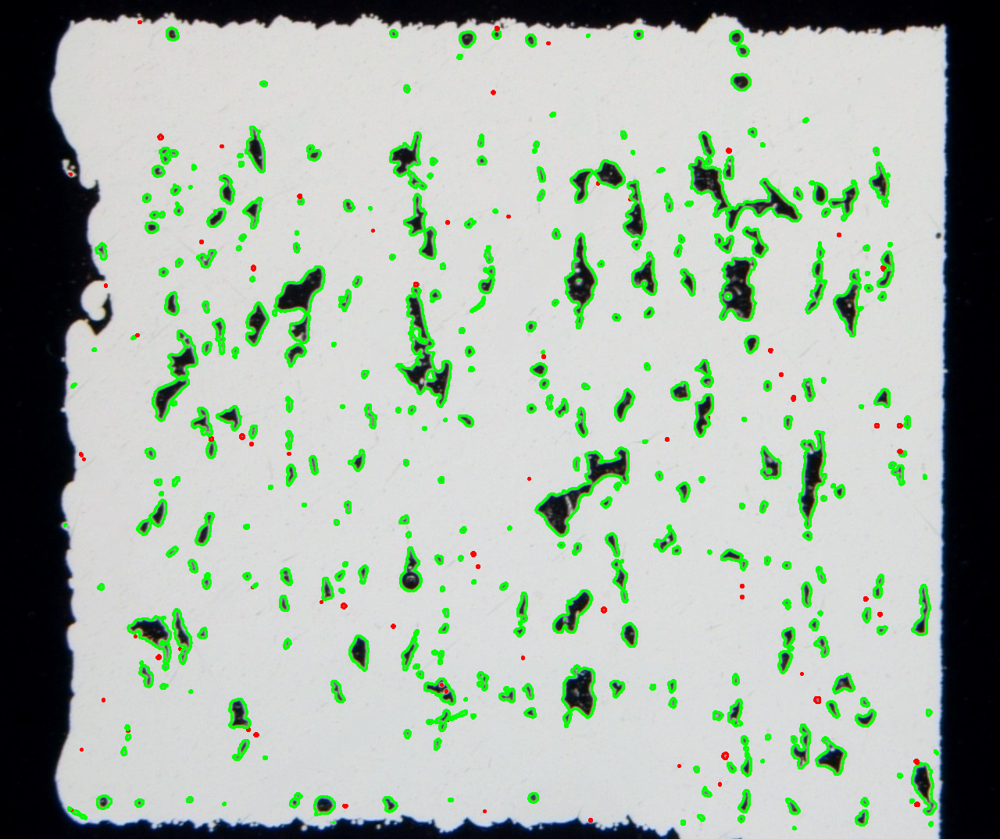

name Linear SVM
y (440,)
label_pred [2]
pred_res (440, 1)
Accuracy =  63.864 %


/usr/local/lib/python3.9/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


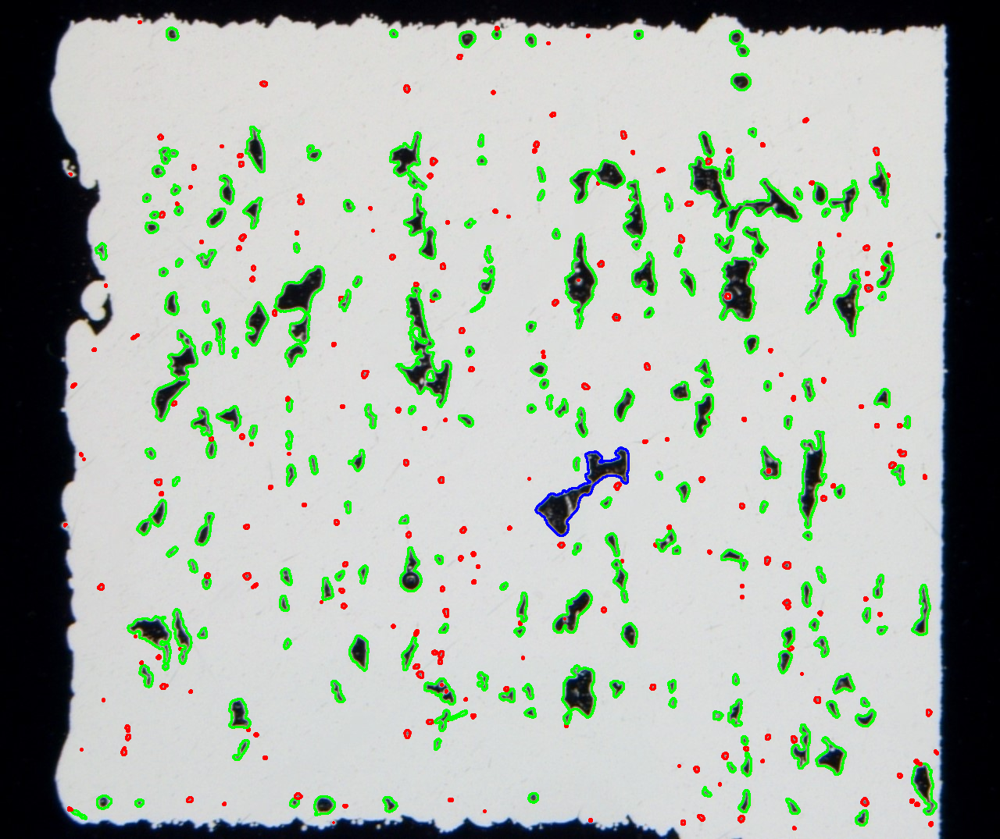

name RBF SVM
y (440,)
label_pred [2]
pred_res (440, 1)
Accuracy =  95.227 %


/usr/local/lib/python3.9/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


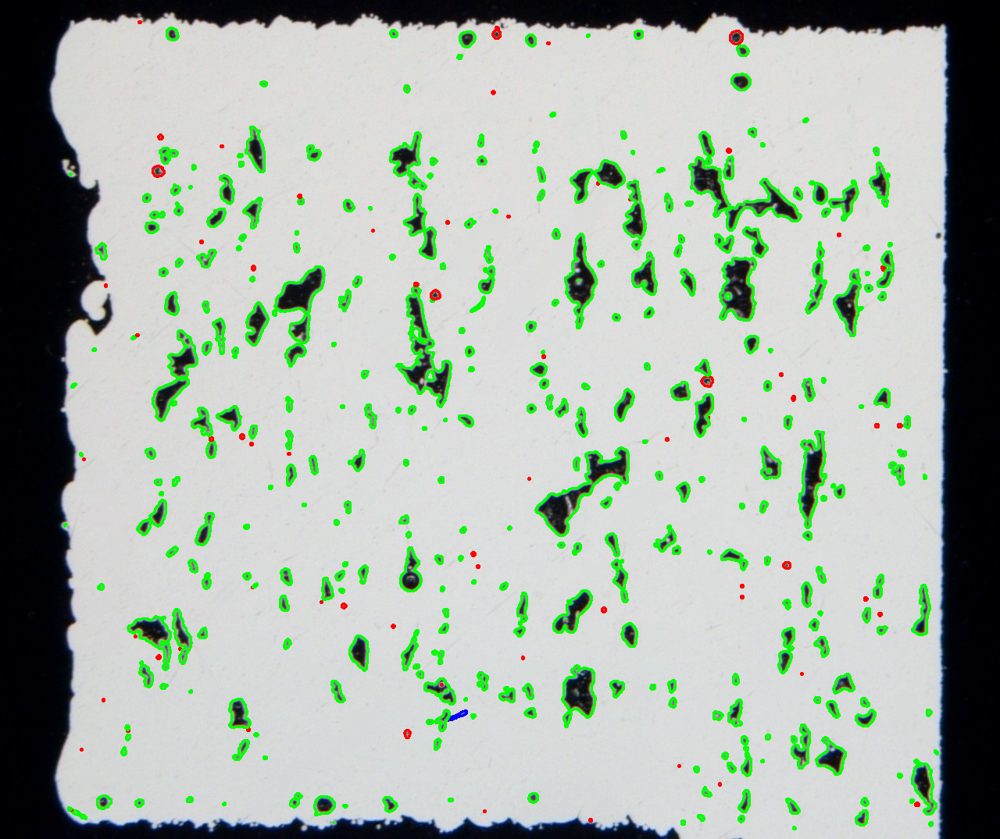

name Decision Tree
y (440,)
label_pred [2]
pred_res (440, 1)
Accuracy =  99.545 %


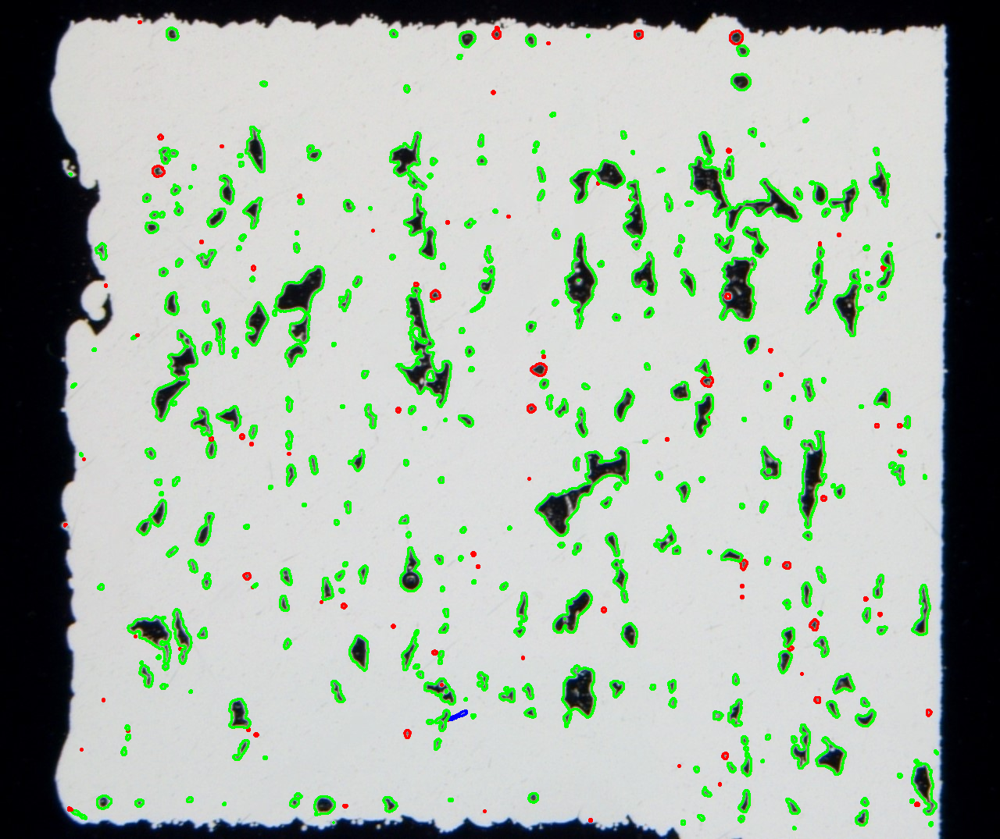

name Random Forest
y (440,)
label_pred [2]
pred_res (440, 1)
Accuracy =  99.318 %


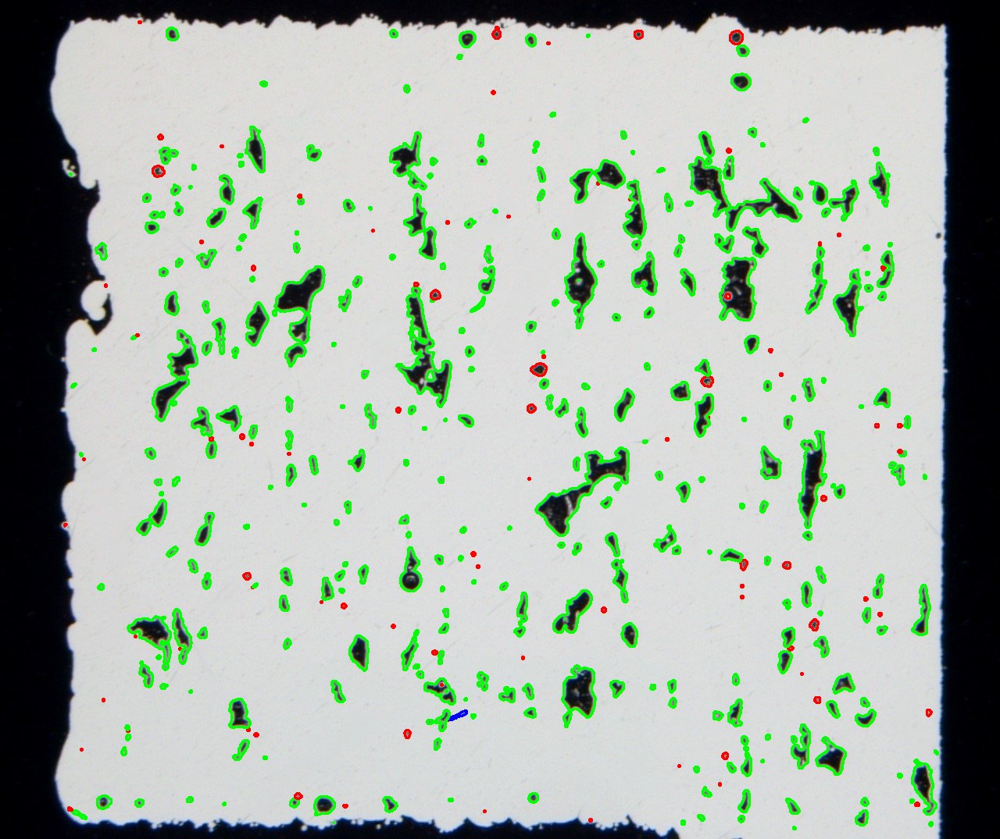

name Neural Net
y (440,)
label_pred [3]
pred_res (440, 1)
Accuracy =  80.227 %


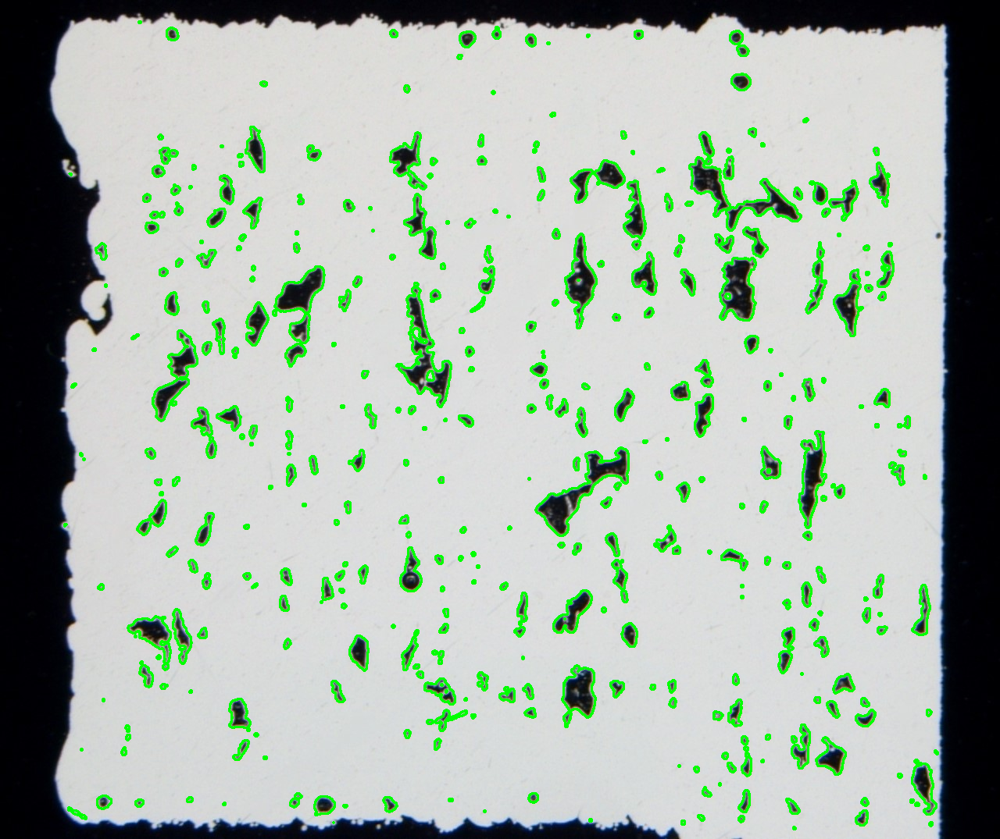

name AdaBoost
y (440,)
label_pred [2]
pred_res (440, 1)
Accuracy =  99.318 %


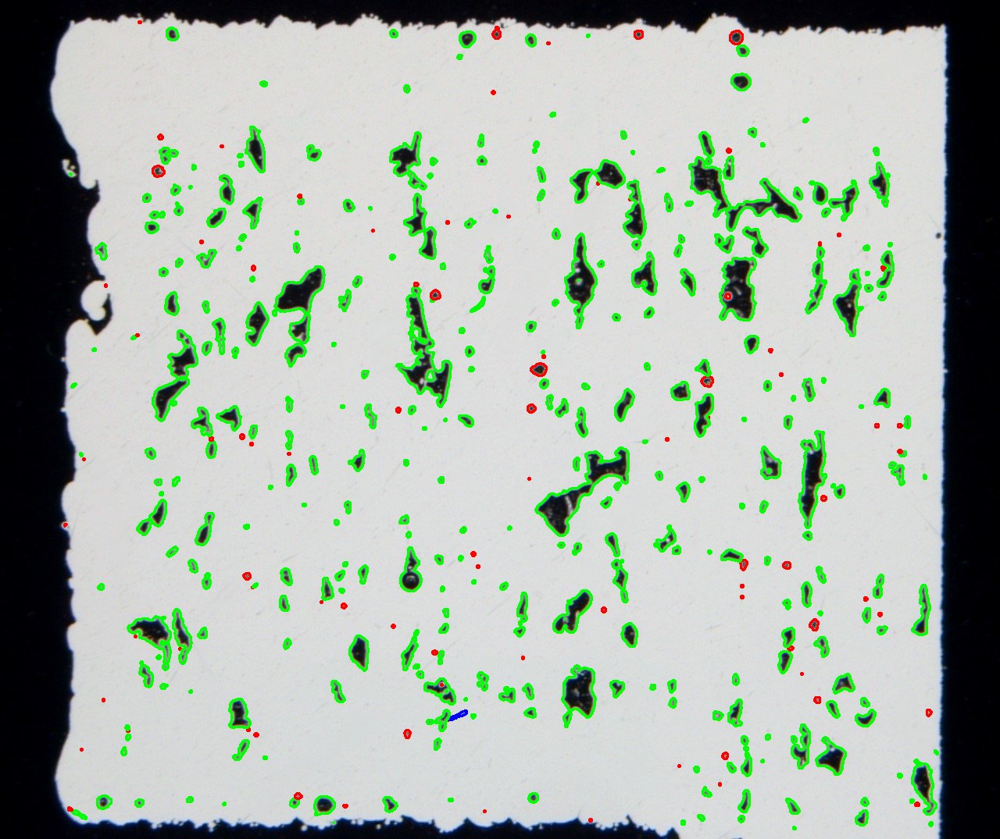

name Naive Bayes
y (440,)
label_pred [2]
pred_res (440, 1)
Accuracy =  98.864 %


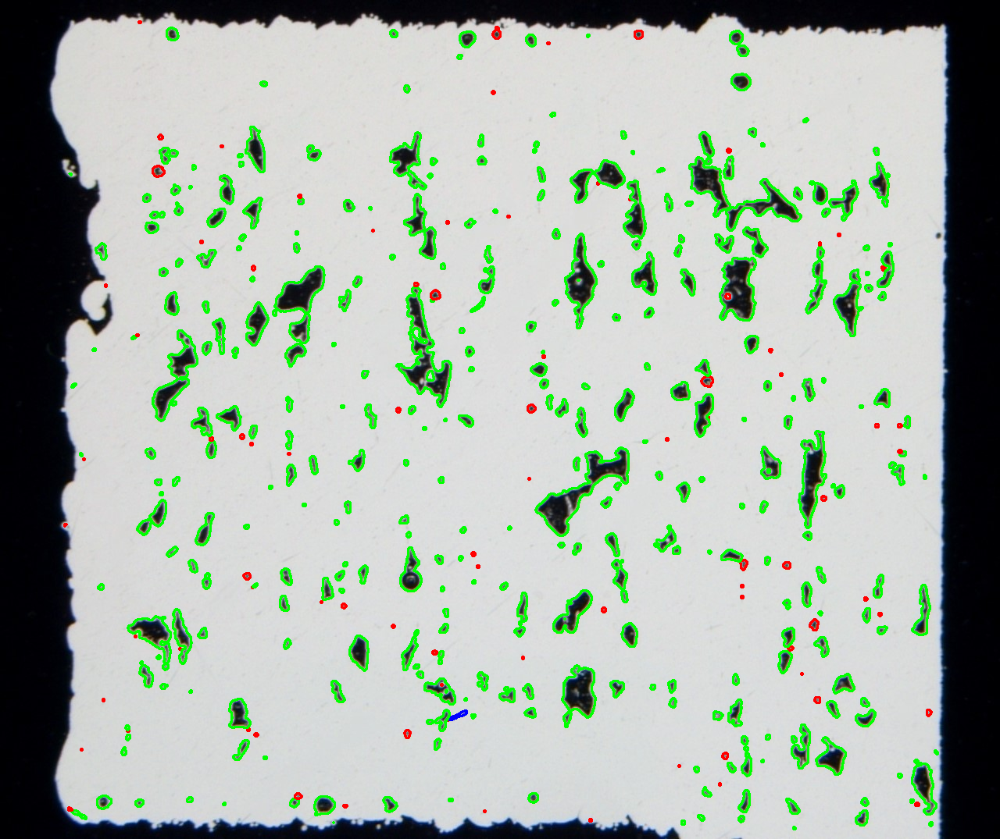

name QDA


ValueError: ignored

In [ ]:
## use multipul classifiers
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from sklearn import metrics
import time
################################### draw the countours
# img = cv2.imread('/content/001_cropped.JPG')
# print(img.shape)
# gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# ret, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
# contours, _ = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
# cv2.drawContours(img, contours, -1, (0,0,255), 2)  # plot the contour
# cv2.imwrite("drawContours.jpg", img)
# cv2_imshow(img)
##################################

img = cv2.imread('/content/001_cropped.JPG')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#img = cv2.imread('/content/Picture11.jpg', cv2.COLOR_BGR2GRAY)

# cv2_imshow(img)
# print(img.shape)
# Threshold the image to obtain binary image
ret, binary = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)

# Find contours in the binary image
#contours, hierarchy = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours, hierarchy = cv2.findContours(binary, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
############################ my code
# Define the feature vector containing aspect ratio and area
# X = np.zeros((len(contours), 2))
# y = np.zeros(len(contours), dtype=np.int32)
X1 = []
X2 = []
y_list = []
print('len main contours', len(contours))
max_cnt = max(contours, key = cv2.contourArea)


#cv.drawContours(	image, contours, contourIdx, color[, thickness[, lineType[, hierarchy[, maxLevel[, offset]]]]]	) -> 	image

for i, cnt in enumerate(contours):
  rect = cv2.minAreaRect(cnt) #%
  area = cv2.contourArea(cnt)
  max_area=cv2.contourArea(max_cnt)
#for cnt in contours:
  if area != max_area and area != 0: # if the current contour area is not equal to workpiece area 
    (cx, cy), (w, h), angle = rect # No conversion reqird in the aspect ratio the unit divided
    aspect_ratio = max(w, h) / min(w, h) 
    # Store the feature vector and label for this contour
    # X[i, 0] = aspect_ratio
    # X[i, 1] = area
    X1.append(aspect_ratio)
    X2.append(area)    
    # Get the shape of the contour
    if aspect_ratio >= 5:
        #y[i] = 1  # Label as an line
        y_list.append(1)  # Label as an line
    elif aspect_ratio > 1 and aspect_ratio < 5:
        y_list.append(3)  # Label as an ellipse 
    else:
        y_list.append(2)  # Label as a circle

X = np.zeros((len(X1), 2))
y = np.zeros(len(y_list), dtype=np.int32)

X[:,0] = np.asarray(X1)
X[:,1] = np.asarray(X2)
y = np.asarray(y_list)

############################### list of classifieres:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.inspection import DecisionBoundaryDisplay

##https://scikit-learn.org/stable/modules/neural_networks_supervised.html
names = ["Nearest Neighbors", "Linear SVM","RBF SVM","Decision Tree","Random Forest","Neural Net","AdaBoost","Naive Bayes", "QDA"]
##,"Gaussian Process"
classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025, max_iter=100, random_state=42),
    SVC(gamma=2, C=1, max_iter=100, random_state=42),
    #GaussianProcessClassifier(1.0 * RBF(1.0),random_state = 42),
    DecisionTreeClassifier(max_depth=5, random_state = 42),
    RandomForestClassifier(max_depth=5, n_estimators=100, max_features=1, random_state = 42),
    MLPClassifier(alpha=1, max_iter=1000, random_state = 42),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis(),
]
## , random_state=42


# names = ["Linear SVM","RBF SVM","Decision Tree","Random Forest","Neural Net","AdaBoost","Naive Bayes", "QDA"]
# ##,"Gaussian Process"
# classifiers = [
#     SVC(kernel="linear", C=0.025, max_iter=100, random_state=42),
#     SVC(gamma=2, C=1, max_iter=100, random_state=42),
#     #GaussianProcessClassifier(1.0 * RBF(1.0),random_state = 42),
#     DecisionTreeClassifier(max_depth=5, random_state = 42),
#     RandomForestClassifier(max_depth=5, n_estimators=100, max_features=1, random_state = 42),
#     MLPClassifier(alpha=1, max_iter=1000, random_state = 42),
#     AdaBoostClassifier(),
#     GaussianNB(),
#     QuadraticDiscriminantAnalysis(),
# ]
################################
# # Train a random forest classifier on the feature vector and label
# from sklearn.ensemble import RandomForestClassifier
# clf = RandomForestClassifier(n_estimators=100)
# clf.fit(X, y)

# Predict the labels of new contours based on their feature vector
#new_cnts, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
################################### find countour to another image for testing
img_new = cv2.imread('/content/001_cropped.JPG') # new image for test
gray = cv2.cvtColor(img_new, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
new_cnts, _ = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
##################################
#new_cnts, _ = cv2.findContours(binary, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
#max_cnt = max(contours, key = cv2.contourArea)
print('len cnt', len(new_cnts))

#######new code
start_train_time = time.time()
for name, clf in zip(names, classifiers):
  print('name', name)
  # Train the model on training data
  clf.fit(X, y)
  train_time = time.time()-start_train_time
  local_train_time = time.localtime(train_time)
  
  ####### old code
  label_pred_list = []
  for cnt in new_cnts:
  # for i, cnt in enumerate(contours):
    rect = cv2.minAreaRect(cnt) #%
    area = cv2.contourArea(cnt)
    #max_area=cv2.contourArea(max_cnt)
    if area != max_area and area != 0: # if the current contour area is not equal to workpiece area 
      (cx, cy), (w, h), angle = rect # No conversion reqird in the aspect ratio the unit divided
      aspect_ratio = max(w, h) / min(w, h) 

      # Use the trained classifier to predict the label
      label_pred = clf.predict([[aspect_ratio, area]])

      # print('[[aspect_ratio, area]]', [[aspect_ratio, area]])
      # print('label_pred', label_pred.shape)
      label_pred_list.append(label_pred)
      # print('X',X.shape)
      # print('y',y.shape)

      ##label_pred = clf.predict(X)
      #print('pred_label', label_pred)
      # Draw the contour with the predicted label
      if label_pred == 1:
          cv2.drawContours(img, [cnt], 0,  (255, 0, 0), 2)  # Blue for lines
          #print("red")
          #color = (0, 0, 255)  # Red for lines
      elif label_pred == 2:
          cv2.drawContours(img, [cnt], 0, (0, 0, 255), 2)  # red for circles
          #print("green")
          #color = (0, 255, 0) # Green for circles
      else:
          cv2.drawContours(img, [cnt], 0,  (0, 255, 0), 2)  # Green for ellipses
          #print("blue")
          #color = (255, 0, 0)  # Blue for ellipses

  print('y',y.shape)
  # print('label_pred', label_pred.shape)
  print('label_pred', label_pred)
  # label_pred_new=np.asanyarray(label_pred_list)
  # print('label_pred_new', label_pred_new.shape)
  # label_pred_new=(label_pred_new.reshape(y.shape).shape)
  # print('label_pred_new', label_pred_new.shape)
  # print ("Accuracy = ", metrics.accuracy_score(y, label_pred_new))

  pred_res = np.asarray(label_pred_list)
  print('pred_res', pred_res.shape)
  #print ("Accuracy = ", metrics.accuracy_score(y, pred_res))
  acc = metrics.accuracy_score(y, pred_res)*100
  print ("Accuracy = ", round(acc,3), '%')

  # Display the result
  #cv2.drawContours(img, contours, -1, color, 2)  # plot the contour
  cv2.imwrite("{}_res_drawContours.jpg".format(name), img)
  cv2_imshow(img)
